### Hier Dokumentiert, was in den einzelnen Schritten gemacht wird. Einzelne Abschnitte werden mit Markdown kommentiert, damit es übersichtlicher wird. 
Die restliche Dokumentation wird über Kommentare in den Codeblöcken gemacht. 
Die angegbenen Links sind Quellen aus denen ich Codes teilweise übernommen oder die als inspiration gedient haben.

In [2]:
#Die Libraries die gebraucht werden, werden importiert.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy as spacy
from collections import Counter
#Der Datensatz wird als Variable df aus der CSV importiert. 
#In diesem Datensatz werden die Inhalte mit einem Kommata getrennt. 
df = pd.read_csv("/Users/marenabele/Desktop/Data-Storytelling_2.0/Data/ted-talks.csv", sep =",")
df
#Da der hier angezeigte Datensatz nur für mich zu Übersicht gilt, wird dieser nicht weiter gestylt. 
#Aussuchen der ColorMap für die Darstellungen https://matplotlib.org/3.5.0/tutorials/colors/colormaps.html

,title,author,date,views,likes,link
0,Climate action needs new frontline leadership,Ozawa Bineshi Albert,December 2021,404000,12000,https://ted.com/talks/ozawa_bineshi_albert_cli...
1,The dark history of the overthrow of Hawaii,Sydney Iaukea,February 2022,214000,6400,https://ted.com/talks/sydney_iaukea_the_dark_h...
2,How play can spark new ideas for your business,Martin Reeves,September 2021,412000,12000,https://ted.com/talks/martin_reeves_how_play_c...
3,Why is China appointing judges to combat clima...,James K. Thornton,October 2021,427000,12000,https://ted.com/talks/james_k_thornton_why_is_...
4,Cement's carbon problem — and 2 ways to fix it,Mahendra Singhi,October 2021,2400,72,https://ted.com/talks/mahendra_singhi_cement_s...
...,...,...,...,...,...,...
5435,The best stats you've ever seen,Hans Rosling,February 2006,15000000,458000,https://ted.com/talks/hans_rosling_the_best_st...
5436,Do schools kill creativity?,Sir Ken Robinson,February 2006,72000000,2100000,https://ted.com/talks/sir_ken_robinson_do_scho...
5437,Greening the ghetto,Majora Carter,February 2006,2900000,88000,https://ted.com/talks/majora_carter_greening_t...
5438,Simplicity sells,David Pogue,February 2006,2000000,60000,https://ted.com/talks/david_pogue_simplicity_s...


## Wissenswertes über den Datensatz

In [3]:
#Wie viele Autoren und Ted Talks gibt es insgesamt?
#Diese Abfrage habe ich ganz am Anfang gemacht gehabt, um ein Gefühl für den Datensatz zu erhalten. 
#Da diese Abfrage jetzt aber aufgesplittet wurde, ist diese Abfrage nun auskommentieren.
#df.nunique()

In [4]:
#Wie viele Videos hat der Datensatz insgesamgt?
count_titles = df["title"].nunique()
print("Der Datensatz besteht aus", count_titles, "Videos.")

Der Datensatz besteht aus 5440 Videos.


In [5]:
#Wie viele Autoren gibt es?
count_authors = df["author"].nunique()
print("Es gibt", count_authors, "Autoren. Diese haben", count_titles, "Videos geschrieben.")

#Welche sind die Top Autoren?
#df.value_counts("author", ascending = False).to_frame()
#wurde ausgeklammert, da ich es nun als Variable speichere. Um es zu Stylen muss die Variable 
#als Dataset gespeichert werden, deswegen wird die Serie mit .to_frame umgewandelt.

df_common_author = df.value_counts("author", ascending = False).to_frame(name="Anzahl der Videos")
#print("Die Top Autoren sind die Folgenden: \n", df_common_author)
#Print Statement wurde ausgeklammert, da die Liste im nächsten Schritt gestylt wurde. 



#https://towardsdatascience.com/style-pandas-dataframe-like-a-master-6b02bf6468b0
#background_gradient auf Reds damit die Hintergrundfarbe der Häufigkeit angepasst wird.
#Je Häufiger ein Autor vorkommt, desto roter ist die Farbe.
df_common_author.style.background_gradient(cmap="Reds").set_caption("Anzahl der Videos je Autor")

Es gibt 4443 Autoren. Diese haben 5440 Videos geschrieben.


,Anzahl der Videos
author,
Alex Gendler,45
Iseult Gillespie,33
Matt Walker,18
Alex Rosenthal,15
Elizabeth Cox,13
Emma Bryce,12
Daniel Finkel,11
Juan Enriquez,11
Dan Finkel,9


In [6]:
#TOP 8 Autoren durchschnittliche Likes
mask = (df["author"] == "Alex Gendler") | (df["author"] == "Iseult Gillespie") | (df["author"] == "Matt Walker	") | (df["author"] == "Alex Rosenthal") | (df["author"] == "Elizabeth Cox") | (df["author"] == "Emma Bryce") | (df["author"] == "Daniel Finkel") | (df["author"] == "Juan Enriquez") 
df_author_likes = df[mask]

top_8_autoren = ["Alex Gendler", "Iseult Gillespie", "Matt Walker", "Alex Rosenthal", "Elizabeth Cox", "Emma Bryce",
                 "Daniel Finkel", "Juan Enriquez"]

author_agg = dict()

for author in top_8_autoren:
    mask = df["author"] == author
    author_agg[author] = df[mask]["likes"].mean().__round__()
author_agg

#https://stackoverflow.com/questions/20340844/pandas-create-named-columns-in-dataframe-from-dict

df_top8_likes = pd.DataFrame(list(author_agg.items()),
                      columns=["Autor", "Durchschnittliche Likes"])

#df_top8_likes = pd.DataFrame.from_dict(author_agg, orient="index")
df_top8_likes



df_top8_likes.to_csv(r"/Users/marenabele/Desktop/Data-Storytelling_2.0/Data/Top8_Autore_Likes.csv", index=False)


In [7]:
#TOP 8 Autoren durchschnittliche Views
mask = (df["author"] == "Alex Gendler") | (df["author"] == "Iseult Gillespie") | (df["author"] == "Matt Walker	") | (df["author"] == "Alex Rosenthal") | (df["author"] == "Elizabeth Cox") | (df["author"] == "Emma Bryce") | (df["author"] == "Daniel Finkel") | (df["author"] == "Juan Enriquez") 
df_author_views = df[mask]

top_8_autoren = ["Alex Gendler", "Iseult Gillespie", "Matt Walker", "Alex Rosenthal", "Elizabeth Cox", "Emma Bryce",
                 "Daniel Finkel", "Juan Enriquez"]

author_agg = dict()

for author in top_8_autoren:
    mask = df["author"] == author
    author_agg[author] = df[mask]["views"].mean().__round__()
author_agg

df_top8_views = pd.DataFrame(list(author_agg.items()),
                      columns=["Autor", "Durchschnittliche Views"])
df_top8_views

df_top8_views.to_csv(r"/Users/marenabele/Desktop/Data-Storytelling_2.0/Data/Top8_Autore_Views.csv", index=False)


In [8]:
#In welchem Monat und Jahr kamen am meisten Ted Talks heraus?
df.value_counts("date")
#print(df.value_counts("date"),"\n\n Die meisten Videos wurden im April 2018 veröffentlicht. In diesem Monat gab es 127 Videos.")
#Print Statement wurde ausgeklammert, da die Liste im nächsten Schritt gestylt wurde.

df_common_date = df.value_counts("date").to_frame(name = "Anzahl der Vidoes")

#https://towardsdatascience.com/style-pandas-dataframe-like-a-master-6b02bf6468b0
#background_gradient auf Reds damit die Hintergrundfarbe der Häufigkeit angepasst wird.
#Je Häufiger ein Datum vorkommt, desto roter ist die Farbe.
df_common_date.style.background_gradient(cmap="Reds").set_caption("Anzahl der Videos im Monat und Jahr")

#Gernell fällt auf, dass die Ergebnisse hier mit den meisten Videos im April und November der Jahr 2017, 2018 und 2019 waren. 
#Hier wäre eine Frage, warum es in diesen Monaten wohl mehr Videos gab. 
#Gab es besondere Ereignisse? Gab es evtl. eine richtige TED Konfernez?


,Anzahl der Vidoes
date,
April 2018,127
April 2019,124
April 2017,123
November 2018,115
November 2017,109
October 2020,97
March 2014,96
February 2016,89
March 2015,88


In [9]:
#Was sind die Top Talks? // Likes
df["likes"].max()

#Das Video mit den meisten Likes hat 2100000 Likes. 
#Nach dem Video filtere ich jetzt

df_video_likes_max = df.sort_values("likes", ascending = False)
df_video_likes_max.style.background_gradient(cmap="Reds", subset="likes").hide_index()



title,author,date,views,likes,link
Do schools kill creativity?,Sir Ken Robinson,February 2006,72000000,2100000,https://ted.com/talks/sir_ken_robinson_do_schools_kill_creativity
Your body language may shape who you are,Amy Cuddy,June 2012,64000000,1900000,https://ted.com/talks/amy_cuddy_your_body_language_may_shape_who_you_are
Inside the mind of a master procrastinator,Tim Urban,February 2016,60000000,1800000,https://ted.com/talks/tim_urban_inside_the_mind_of_a_master_procrastinator
The power of vulnerability,Brené Brown,June 2010,56000000,1700000,https://ted.com/talks/brene_brown_the_power_of_vulnerability
How great leaders inspire action,Simon Sinek,September 2009,57000000,1700000,https://ted.com/talks/simon_sinek_how_great_leaders_inspire_action
How to speak so that people want to listen,Julian Treasure,June 2013,49000000,1400000,https://ted.com/talks/julian_treasure_how_to_speak_so_that_people_want_to_listen
My philosophy for a happy life,Sam Berns,October 2013,43000000,1300000,https://ted.com/talks/sam_berns_my_philosophy_for_a_happy_life
The next outbreak? We're not ready,Bill Gates,March 2015,43000000,1300000,https://ted.com/talks/bill_gates_the_next_outbreak_we_re_not_ready
What makes a good life? Lessons from the longest study on happiness,Robert Waldinger,November 2015,41000000,1200000,https://ted.com/talks/robert_waldinger_what_makes_a_good_life_lessons_from_the_longest_study_on_happiness
10 things you didn't know about orgasm,Mary Roach,February 2009,37000000,1100000,https://ted.com/talks/mary_roach_10_things_you_didn_t_know_about_orgasm


In [10]:
#Was sind die schlechtesten Talks? // Likes
df["likes"].min()

#Das Video mit den wenigsten Likes hat 15 Likes.
#Nach dem Video filtere ich jetzt 

df_video_likes_min = df.sort_values("likes", ascending = True)
df_video_likes_min.style.background_gradient(cmap="Reds", subset="likes").hide_index()


title,author,date,views,likes,link
Year In Ideas 2015,nan,December 2015,532,15,https://ted.com/talks/year_in_ideas_2015
Post-Pandemic Paradise in Rapa Nui,Far Flung,October 2020,1200,37,https://ted.com/talks/far_flung_post_pandemic_paradise_in_rapa_nui
Virtual Worlds,Far Flung,November 2020,1300,39,https://ted.com/talks/far_flung_virtual_worlds
"""Part II. The Journey Through Time"" / ""Ruslan and Lyudmila""",Deutsche Philharmonie Merck,November 2018,1300,40,https://ted.com/talks/deutsche_philharmonie_merck_part_ii_the_journey_through_time_ruslan_and_lyudmila
"""Jamie Raeburn"" / ""Baloo Baleerie"" / ""Twa recruitin Sergeants""",Findlay Napier and Gillian Frame,July 2019,1300,40,https://ted.com/talks/findlay_napier_and_gillian_frame_jamie_raeburn_baloo_baleerie_twa_recruitin_sergeants
The case for public media,Qi Wu 吴琪,November 2020,1500,47,https://ted.com/talks/qi_wu_the_case_for_public_media
"""Dive In""",Dave Matthews,October 2021,1600,49,https://ted.com/talks/dave_matthews_dive_in
A chef shares: Here's how we can feed the planet without hurting the climate,Peggy Chan,October 2020,2100,65,https://ted.com/talks/peggy_chan_a_chef_shares_here_s_how_we_can_feed_the_planet_without_hurting_the_climate
Facing the future together,Rowan Fitzpatrick and Heart of Mind,December 2017,2200,68,https://ted.com/talks/rowan_fitzpatrick_and_heart_of_mind_facing_the_future_together
"""Good Morning Young Artist"" and ""Ms. Metronome""",Mike Sempert,September 2014,2400,72,https://ted.com/talks/mike_sempert_good_morning_young_artist_and_ms_metronome


In [11]:
#Was sind die Top Talks? // Views
df["views"].max()

#Das Video mit den meisten Views hat 72000000 Aufrufe. 
#Nach dem Video filtere ich jetzt

df_video_views_max = df.sort_values("views", ascending = False)
df_video_views_max.style.background_gradient(cmap="Reds", subset="views").hide_index()

title,author,date,views,likes,link
Do schools kill creativity?,Sir Ken Robinson,February 2006,72000000,2100000,https://ted.com/talks/sir_ken_robinson_do_schools_kill_creativity
Your body language may shape who you are,Amy Cuddy,June 2012,64000000,1900000,https://ted.com/talks/amy_cuddy_your_body_language_may_shape_who_you_are
Inside the mind of a master procrastinator,Tim Urban,February 2016,60000000,1800000,https://ted.com/talks/tim_urban_inside_the_mind_of_a_master_procrastinator
How great leaders inspire action,Simon Sinek,September 2009,57000000,1700000,https://ted.com/talks/simon_sinek_how_great_leaders_inspire_action
The power of vulnerability,Brené Brown,June 2010,56000000,1700000,https://ted.com/talks/brene_brown_the_power_of_vulnerability
How to speak so that people want to listen,Julian Treasure,June 2013,49000000,1400000,https://ted.com/talks/julian_treasure_how_to_speak_so_that_people_want_to_listen
My philosophy for a happy life,Sam Berns,October 2013,43000000,1300000,https://ted.com/talks/sam_berns_my_philosophy_for_a_happy_life
The next outbreak? We're not ready,Bill Gates,March 2015,43000000,1300000,https://ted.com/talks/bill_gates_the_next_outbreak_we_re_not_ready
What makes a good life? Lessons from the longest study on happiness,Robert Waldinger,November 2015,41000000,1200000,https://ted.com/talks/robert_waldinger_what_makes_a_good_life_lessons_from_the_longest_study_on_happiness
"Looks aren't everything. Believe me, I'm a model.",Cameron Russell,October 2012,38000000,1100000,https://ted.com/talks/cameron_russell_looks_aren_t_everything_believe_me_i_m_a_model


In [12]:
#Was sind die schlechtesten Talks? // Views
df["views"].min()

#Das Video mit den wenigsten Views hat 532 Aufrufe.
#Nach dem Video filtere ich jetzt 

df_video_views_min = df.sort_values("views", ascending = True)
df_video_views_min.style.background_gradient(cmap="Reds", subset="views").hide_index()


title,author,date,views,likes,link
Year In Ideas 2015,nan,December 2015,532,15,https://ted.com/talks/year_in_ideas_2015
Post-Pandemic Paradise in Rapa Nui,Far Flung,October 2020,1200,37,https://ted.com/talks/far_flung_post_pandemic_paradise_in_rapa_nui
Virtual Worlds,Far Flung,November 2020,1300,39,https://ted.com/talks/far_flung_virtual_worlds
"""Jamie Raeburn"" / ""Baloo Baleerie"" / ""Twa recruitin Sergeants""",Findlay Napier and Gillian Frame,July 2019,1300,40,https://ted.com/talks/findlay_napier_and_gillian_frame_jamie_raeburn_baloo_baleerie_twa_recruitin_sergeants
"""Part II. The Journey Through Time"" / ""Ruslan and Lyudmila""",Deutsche Philharmonie Merck,November 2018,1300,40,https://ted.com/talks/deutsche_philharmonie_merck_part_ii_the_journey_through_time_ruslan_and_lyudmila
The case for public media,Qi Wu 吴琪,November 2020,1500,47,https://ted.com/talks/qi_wu_the_case_for_public_media
"""Dive In""",Dave Matthews,October 2021,1600,49,https://ted.com/talks/dave_matthews_dive_in
A chef shares: Here's how we can feed the planet without hurting the climate,Peggy Chan,October 2020,2100,65,https://ted.com/talks/peggy_chan_a_chef_shares_here_s_how_we_can_feed_the_planet_without_hurting_the_climate
Facing the future together,Rowan Fitzpatrick and Heart of Mind,December 2017,2200,68,https://ted.com/talks/rowan_fitzpatrick_and_heart_of_mind_facing_the_future_together
Cement's carbon problem — and 2 ways to fix it,Mahendra Singhi,October 2021,2400,72,https://ted.com/talks/mahendra_singhi_cement_s_carbon_problem_and_2_ways_to_fix_it


In [13]:
#Was ist die Durchschhnittliche Like-Anzahl für alle Videos?
df_durchschchnitt_likes = df["likes"].mean()
print("Die durchschnittliche Like-Anzahl für alle Videos sind", df_durchschchnitt_likes.__round__(),"likes.")

Die durchschnittliche Like-Anzahl für alle Videos sind 62608 likes.


In [14]:
#Was ist die Durchschnittliche View-Anzahl für alle Videos?
df_durchschnitt_views = df["views"].mean()
print("Die durchschnittliche View-Anzahl für alle Videos sind", df_durchschnitt_views.__round__(),"Aufrufe.")

Die durchschnittliche View-Anzahl für alle Videos sind 2061576 Aufrufe.


In [15]:
#Wie viele likes hat ein Videos erhalten im Verhätlnis zu den Views
df_verhätlnis_likes_views = df.views / df.likes
df_verhätlnis_likes_views.max()
df_verhätlnis_likes_views.min()

print("Das beste Vrehältnis von Likes zu den Views ist", df_verhätlnis_likes_views.max().__round__(2),"%. Das schlechteste Verhältnis von Likes zu den Views ist", df_verhätlnis_likes_views.min().__round__(2),"%.")

Das beste Vrehältnis von Likes zu den Views ist 36.4 %. Das schlechteste Verhältnis von Likes zu den Views ist 30.4 %.


In [16]:
#Datums Fragenstellungen
#In welchem Jahr gab es die meisten Ted Talks // Entwicklung der Ted Talks über die Jahre von Frühsten Datum bis spätesten Datum

#https://towardsdatascience.com/working-with-datetime-in-pandas-dataframe-663f7af6c587 Erst einmal aus der "Date" Spalte  extra Spalten machen mit Monat und Jahr - durch Datetime wurde automaitsch immer der 01. aus einem Monat als Tag ergänzt. 
#Da der Tag beim originalen Datensatz nicht angegeben wird, wird der Tag nicht weiter beachtet.
#Day wird ignoriert, da es beim konvertieren immer der 1. des Monats wird, da es im eigentlichen Dataset keine Angaben zum Tag gibt. 
#https://www.delftstack.com/de/howto/python-pandas/how-to-convert-dataframe-column-to-datetime-in-pandas/ Für das Import-Statement
from datetime import datetime, timedelta
df["date"] = pd.to_datetime(df["date"])

In [17]:
#Die Spalte Date wird in 2 neue Spalten gespeichert. Die neuen Spalten sind Jahr und Monat des TED Talkes.
df["year"]= df["date"].dt.year
df["month"]= df["date"].dt.month

df_year = df
df_year
#Jetzt können die Daten besser untersucht werden.

,title,author,date,views,likes,link,year,month
0,Climate action needs new frontline leadership,Ozawa Bineshi Albert,2021-12-01,404000,12000,https://ted.com/talks/ozawa_bineshi_albert_cli...,2021,12
1,The dark history of the overthrow of Hawaii,Sydney Iaukea,2022-02-01,214000,6400,https://ted.com/talks/sydney_iaukea_the_dark_h...,2022,2
2,How play can spark new ideas for your business,Martin Reeves,2021-09-01,412000,12000,https://ted.com/talks/martin_reeves_how_play_c...,2021,9
3,Why is China appointing judges to combat clima...,James K. Thornton,2021-10-01,427000,12000,https://ted.com/talks/james_k_thornton_why_is_...,2021,10
4,Cement's carbon problem — and 2 ways to fix it,Mahendra Singhi,2021-10-01,2400,72,https://ted.com/talks/mahendra_singhi_cement_s...,2021,10
...,...,...,...,...,...,...,...,...
5435,The best stats you've ever seen,Hans Rosling,2006-02-01,15000000,458000,https://ted.com/talks/hans_rosling_the_best_st...,2006,2
5436,Do schools kill creativity?,Sir Ken Robinson,2006-02-01,72000000,2100000,https://ted.com/talks/sir_ken_robinson_do_scho...,2006,2
5437,Greening the ghetto,Majora Carter,2006-02-01,2900000,88000,https://ted.com/talks/majora_carter_greening_t...,2006,2
5438,Simplicity sells,David Pogue,2006-02-01,2000000,60000,https://ted.com/talks/david_pogue_simplicity_s...,2006,2


In [18]:
#Von wann ist der erster TED Talk?
df["date"].min()
print("Der älteste TED Talk im Datensatz ist auf das folgende Datum datiert:", df["date"].min(), ". Also Januar 1970. ")

Der älteste TED Talk im Datensatz ist auf das folgende Datum datiert: 1970-01-01 00:00:00 . Also Januar 1970. 


In [19]:
#Neuester TED Talk im Datensatz
df["date"].max()
print("Der neueste TED Talk im Datensatz ist auf das folgende Datum datiert:", df["date"].max(), ". Also Februar 2022.")

Der neueste TED Talk im Datensatz ist auf das folgende Datum datiert: 2022-02-01 00:00:00 . Also Februar 2022.


In [20]:
#Videos pro Jahr
#df_count_years = df_year.value_counts("year")

df_count_years = df_year.value_counts("year", ascending = False).to_frame(name= "Videos pro Jahr")
#Je mehr Videos in einem Jahr veröffentlicht wurden, desto roter ist die Farbe.

df_count_years.style.background_gradient(cmap="Reds").set_caption("Anzahl der Videos pro Jahr")
#Überschrift muss noch mittig gestylt werden

#Dataset geht von 1970 bis 2021. Die Älteren wurden natürlich erst später hochgeladen, aber ist natürlich verständlich, da es die Seite noch nicht gab.

# Damit es für die Grafik verwendet werden kann wird das Ergebnis als CSV-Datei exportiert. 
df_count_years_2 = df_year.value_counts("year")

df_count_years_2.to_csv(r"/Users/marenabele/Desktop/Data-Storytelling_2.0/Data/count_years.csv", index=True)

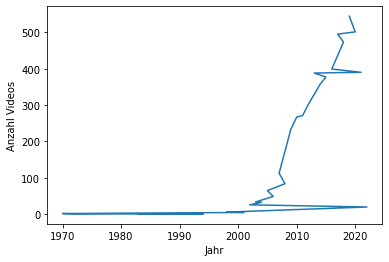

In [21]:
plt.plot(df_count_years)
plt.xlabel("Jahr")
plt.ylabel("Anzahl Videos")
plt.show()

## Analysis

In [22]:
#In welchem Monat und Jahr kamen die meisten Ted Talks heraus?
#df_count_month_and_year = df.value_counts("date")

df_count_month_and_year = df.value_counts("date", ascending = False).to_frame(name="Anzahl der Videos")
df_count_month_and_year.style.background_gradient(cmap="Reds").set_caption("Anzahl der Videos pro Monat und Jahr")

# Damit es für die Grafik verwendet werden kann wird das Ergebnis als CSV-Datei exportiert. 
df_count_month_and_year = df.value_counts("date")

df_count_month_and_year.to_csv(r"/Users/marenabele/Desktop/Data-Storytelling_2.0/Data/count_month_and_year.csv", index=True)

In [23]:
#Wie viele würden das Video weiterempfehlen? // Wie ist das Verhätlnis von Views und Likes

wie_vielen_Zuschauern_hat_das_video_gefallen = df.views / df.likes
wie_vielen_Zuschauern_hat_das_video_gefallen

df.insert(5, column="Like-Quote des Videos", value = wie_vielen_Zuschauern_hat_das_video_gefallen)


In [24]:
#Correlation zwischen Views und Likes
#https://realpython.com/numpy-scipy-pandas-correlation-python/ 
x = pd.Series(df["views"])
x
y = pd.Series(df["likes"])
y
xy = pd.DataFrame({"x-values": x, "y-values":y})
xy

,x-values,y-values
0,404000,12000
1,214000,6400
2,412000,12000
3,427000,12000
4,2400,72
...,...,...
5435,15000000,458000
5436,72000000,2100000
5437,2900000,88000
5438,2000000,60000


In [25]:
x.corr(y)
#0.99

0.9996610444062045

In [26]:
correlation_matrix = xy.corr()
correlation_matrix

,x-values,y-values
x-values,1.000000,0.999661
y-values,0.999661,1.000000


In [27]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

In [28]:
import numpy as np
import scipy.stats
x = pd.Series(df["views"])
y = pd.Series(df["likes"])

In [29]:
slope, intercept, r, p, stderr = scipy.stats.linregress(x, y)

In [30]:
line = f'Regression line'
line

'Regression line'

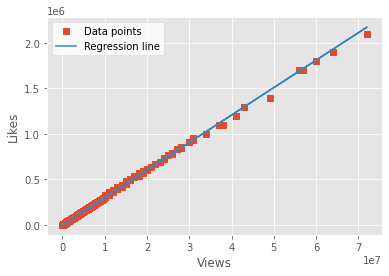

In [31]:
fig, ax = plt.subplots()
ax.plot(x, y, linewidth=0, marker='s', label='Data points')
ax.plot(x, intercept + slope * x, label=line)
ax.set_xlabel("Views")
ax.set_ylabel("Likes")
ax.legend(facecolor='white')
plt.show()

#Wie man in der Grafik sehen kann ist der Zusammenhang von Views und Likes eine nahe zu perfekte linereare Korrelation. 
#Mit dem einem Wert von 0.99 ist es fast an der +1, welche einen vollständig positiven linearer Zusammenhang zwischen 2 Variablen 
#aufweist. 

In [32]:
#Titel analysieren auch für Keywords + Wordcloud

#Neue Packages importieren für die Analyse der Texte 
#https://damu-analytics.de/datascience/how-to-texte-mit-python-analysieren-teil-2/
#https://spacy.io/usage Installieren von Spacy
#https://blog.finxter.com/how-to-install-regex-in-python/ Installieren von Redex
import spacy as spacy
from collections import Counter

In [33]:
#https://damu-analytics.de/datascience/how-to-texte-mit-python-analysieren-teil-2/
df_title = df["title"]
df_title



0           Climate action needs new frontline leadership
1             The dark history of the overthrow of Hawaii
2          How play can spark new ideas for your business
3       Why is China appointing judges to combat clima...
4          Cement's carbon problem — and 2 ways to fix it
                              ...                        
5435                      The best stats you've ever seen
5436                          Do schools kill creativity?
5437                                  Greening the ghetto
5438                                     Simplicity sells
5439                          Averting the climate crisis
Name: title, Length: 5440, dtype: object

In [34]:
from spacy.lang.en.examples import sentences
nlp = spacy.load("en_core_web_md")
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS
import re

In [35]:
df["txt"] = [nlp(text) for text in df.title]
df

,title,author,date,views,likes,Like-Quote des Videos,link,year,month,txt
0,Climate action needs new frontline leadership,Ozawa Bineshi Albert,2021-12-01,404000,12000,33.666667,https://ted.com/talks/ozawa_bineshi_albert_cli...,2021,12,"(Climate, action, needs, new, frontline, leade..."
1,The dark history of the overthrow of Hawaii,Sydney Iaukea,2022-02-01,214000,6400,33.437500,https://ted.com/talks/sydney_iaukea_the_dark_h...,2022,2,"(The, dark, history, of, the, overthrow, of, H..."
2,How play can spark new ideas for your business,Martin Reeves,2021-09-01,412000,12000,34.333333,https://ted.com/talks/martin_reeves_how_play_c...,2021,9,"(How, play, can, spark, new, ideas, for, your,..."
3,Why is China appointing judges to combat clima...,James K. Thornton,2021-10-01,427000,12000,35.583333,https://ted.com/talks/james_k_thornton_why_is_...,2021,10,"(Why, is, China, appointing, judges, to, comba..."
4,Cement's carbon problem — and 2 ways to fix it,Mahendra Singhi,2021-10-01,2400,72,33.333333,https://ted.com/talks/mahendra_singhi_cement_s...,2021,10,"(Cement, 's, carbon, problem, —, and, 2, ways,..."
...,...,...,...,...,...,...,...,...,...,...
5435,The best stats you've ever seen,Hans Rosling,2006-02-01,15000000,458000,32.751092,https://ted.com/talks/hans_rosling_the_best_st...,2006,2,"(The, best, stats, you, 've, ever, seen)"
5436,Do schools kill creativity?,Sir Ken Robinson,2006-02-01,72000000,2100000,34.285714,https://ted.com/talks/sir_ken_robinson_do_scho...,2006,2,"(Do, schools, kill, creativity, ?)"
5437,Greening the ghetto,Majora Carter,2006-02-01,2900000,88000,32.954545,https://ted.com/talks/majora_carter_greening_t...,2006,2,"(Greening, the, ghetto)"
5438,Simplicity sells,David Pogue,2006-02-01,2000000,60000,33.333333,https://ted.com/talks/david_pogue_simplicity_s...,2006,2,"(Simplicity, sells)"


In [36]:
#Wie viele Wörter haben alle Titel zusammen
all_words = []
for text in df.txt:
    wordrow = [word.text for word in text]
    all_words.extend(wordrow)
print ("Anzahl an Wörtern in den Titeln:", len(all_words))

Anzahl an Wörtern in den Titeln: 41645


In [37]:
#Wie viele gleiche Wörter gibt es in den Titeln
word_freq = Counter(all_words)
print ("Wie viele gleiche Wörter gibt es in den Titeln:", len(word_freq))

Wie viele gleiche Wörter gibt es in den Titeln: 7160


In [38]:
common_words = word_freq.most_common(50)
#Stylen in eine Tabelle
temp = pd.DataFrame(common_words)
temp.columns = ["Wörter","Anzahl der Wörter"]
temp.style.background_gradient(cmap='Reds').hide_index()
#Wie man erkannen kann sind viele Wörter, die keine Ausagen geben dabei. Wie beispielsweise the, of, to, a aber auch Fragewörter wie how, why, what.

Wörter,Anzahl der Wörter
the,1318
of,1218
The,1101
to,1087
How,929
?,781
a,701
and,656
"""",604
's,528


In [39]:
#Wir wollen häufig vorkommende Wörter, die nichts über den Sinn aussagen, wie "the", "a" oder Satzzeichen rausstreichen
#Text säubern von Sonderzeichen, Satzzeichen und Emojis
def clean_text(text):
    if isinstance((text), (str)):
        text = re.sub('<[^>]*>', '', text)
        text = re.sub('[\d]+', '', text.lower())
        text = re.sub('"', '', text.lower())
        text = re.sub('\[.*?\]', '', text)
        text = re.sub('https?://\S+|www\.\S+', '', text)
        text = re.sub('<.*?>+', '', text)
        text = re.sub('\n', '', text)
        text = re.sub('\w*\d\w*', '', text)
        text = re.sub('\'','', text)
        return text
    if isinstance((text), (list)):
        return_list = []
        for i in range(len(text)):
            temp_text = re.sub('<[^>]*>', '', text[i])
            temp_text = re.sub('[\d]+', '', temp_text.lower())
            temp_text = re.sub('"', '', temp_text.lower())
            temp_text = re.sub('\[.*?\]', '', temp_text)
            temp_text = re.sub('https?://\S+|www\.\S+', '', temp_text)
            temp_text = re.sub('<.*?>+', '', temp_text)
            temp_text = re.sub('\n', '', temp_text)
            temp_text = re.sub('\w*\d\w*', '', temp_text)
            temp_text = re.sub('\'','', temp_text)
            return_list.append(temp_text)
        return(return_list)
    else:
        pass

In [40]:
#Füllwörter entfernen
def remove_stopwords(text):
    wordrow = [word for word in text if word.is_stop != True and word.is_punct != True]
    return wordrow

In [41]:
# Wörter zählen, die zurück gegeben werden
def wordcounter(text):
    freq = len(text)
    return freq

In [42]:
#Dem Datensatz werden neue Spalten hinzugefügt. Die gefilterten Wörter, die Wörter als Keywords, wie viele Wörter es gesäubert sind und wie viele Wörter gestrichen wurden.
df["keywords"] = df['title'].apply(lambda x : clean_text(x))
df["keywords"] = [nlp(text) for text in df.keywords]

df["keywords"] = df["keywords"].apply(lambda x : remove_stopwords(x))
df['word_numb_orig'] = df['txt'].apply(lambda x : wordcounter(x))
df['word_numb_cleaned'] = df["keywords"].apply(lambda x : wordcounter(x))
df.head()

,title,author,date,views,likes,Like-Quote des Videos,link,year,month,txt,keywords,word_numb_orig,word_numb_cleaned
0,Climate action needs new frontline leadership,Ozawa Bineshi Albert,2021-12-01,404000,12000,33.666667,https://ted.com/talks/ozawa_bineshi_albert_cli...,2021,12,"(Climate, action, needs, new, frontline, leade...","[climate, action, needs, new, frontline, leade...",6,6
1,The dark history of the overthrow of Hawaii,Sydney Iaukea,2022-02-01,214000,6400,33.437500,https://ted.com/talks/sydney_iaukea_the_dark_h...,2022,2,"(The, dark, history, of, the, overthrow, of, H...","[dark, history, overthrow, hawaii]",8,4
2,How play can spark new ideas for your business,Martin Reeves,2021-09-01,412000,12000,34.333333,https://ted.com/talks/martin_reeves_how_play_c...,2021,9,"(How, play, can, spark, new, ideas, for, your,...","[play, spark, new, ideas, business]",9,5
3,Why is China appointing judges to combat clima...,James K. Thornton,2021-10-01,427000,12000,35.583333,https://ted.com/talks/james_k_thornton_why_is_...,2021,10,"(Why, is, China, appointing, judges, to, comba...","[china, appointing, judges, combat, climate, c...",10,6
4,Cement's carbon problem — and 2 ways to fix it,Mahendra Singhi,2021-10-01,2400,72,33.333333,https://ted.com/talks/mahendra_singhi_cement_s...,2021,10,"(Cement, 's, carbon, problem, —, and, 2, ways,...","[cements, carbon, problem, , ways, fix]",11,6


In [43]:
#Alle Wörter angezeigt bekommen
#Wie viele Wörter, die nur min. 1x vorkommen es gibt
#Welche die meist vorkommenden Wörter sind. 
all_words = []
for text in df.keywords:
    wordrow = [word.text for word in text if word.is_stop != True and word.is_punct != True and word.text != ' ']
    all_words.extend(wordrow)
print ("Anzahl an Wörtern in den Titeln:", len(all_words))

# word count
word_freq = Counter(all_words)
print ("Wie viele gleiche Wörter gibt es in den Titeln:", len(word_freq))
word_count_clean = len(all_words)
unique_words_clean = len(word_freq)
common_words = word_freq.most_common()

# plot it for nice overview
temp = pd.DataFrame(common_words)
temp.columns = ["Wörter","Anzahl der Wörter"]
temp.style.background_gradient(cmap='Reds')

Anzahl an Wörtern in den Titeln: 20825
Wie viele gleiche Wörter gibt es in den Titeln: 6051


,Wörter,Anzahl der Wörter
0,life,180
1,world,149
2,nt,134
3,new,133
4,future,132
5,change,110
6,work,96
7,help,96
8,climate,91
9,art,86


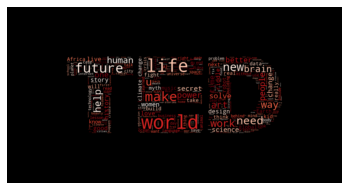

In [44]:
#WORDCLOUD erstellen

#Die Folgenden Wörter sollen Händisch ausgeschlossen werden, da diese in den meisten 400 Wörtern auftauchen, aber ebenfalls nichts zum Sinn des Titels aussagen:
#"nt", "s", "la", "de", "ve", "m", "l", "d", "el" 
#Teilweise spanisch, teilweise Endungen für Kursformen.
#Wordcloud erstellen: https://www.python-lernen.de/wordcloud-erstellen-python.htm
#Für Wordclouds braucht man Strings. Also muss die Tabelle erst in ein String umgewandelt werden.

from wordcloud import WordCloud, ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt
from PIL import Image

#Eigene Idee zum Umwanlden der Wörter mit der Anzahl, damit ich es verwenden kann.
#Wurde so nicht verwendet.
#for x, y in common_words: 
#   content = print(f"{x}, " * y)

#Testen mit weniger Content den Dataframe in einen String umzuwandeln  
#https://www.delftstack.com/de/howto/python/tuple-to-string-python/
#common_words_cloud = str(word_freq.most_common())

#wordcloud = WordCloud().generate(common_words_cloud)
#plt.imshow(wordcloud, interpolation="bilinear")
#plt.show()
# Diese wird nicht verwendet, da ich die Einträge nicht rausstreichen kann, die ich selbst gesehen habe.


#Da ich für die WORDCLOUD funktion einen String brauche, nehme ich die txt Spalte aus meinem Datensatz und 
#benutzte diese, da in dieser ebenfalls alle Wörter enthalten sind. 
#https://re-thought.com/creating-wordclouds-in-python/
content = " ".join(review for review in df.txt.astype(str))

stopwords = set(STOPWORDS) 
stopwords.update(["nt", "s", "la", "de", "ve", "l", "m", "d", "el", "ld", "U", "u"])

#Hier ist die Wordcloud normal dargestellt. Möchte allerdings, dass die Wordcloud in TED Form dargestllt wird, wie das Logo.
#wordcloud = WordCloud().generate(content)
#plt.imshow(wordcloud, interpolation="bilinear")
#plt.show()
wordcloud_format = np.array(Image.open("ted-logo-fb.png"))
wordcloud = WordCloud(background_color="#000000", colormap="Reds", stopwords=STOPWORDS, mask=wordcloud_format, max_words=400, relative_scaling= 1, width=5000, height=2500).generate(content)


plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()